# Otoczka wypukła

In [1]:
import numpy as np
import pandas as pd
from bitalg.tests.test2 import Test
from bitalg.visualizer.main import Visualizer

### Przykładowe zastosowanie narzędzia do wizualizacji

In [2]:
def draw_example_1():
    vis = Visualizer()
    # point = (x, y)
    points = [
        (-62.781083483620016, 9.295526540248986),
        (-10.543100198806997, -26.080520917553812),
        (-81.64932184252287, -74.42163273030921),
        (-36.297317058417946, -72.91194239793609),
        (37.795092197502356, 57.71110085986143),
        (62.511149567563905, -29.172821102708937),
        (21.82806671019955, 2.647377124715007),
        (-46.24539555503924, 42.65521594922478),
        (-77.92302295134137, -7.666110427206263),
        (25.85862324263843, 62.49564419388622),
        (-27.71649622636616, -67.33453457840331),
        (94.83039177581244, -55.52473300629532),
        (-26.29675918891381, -51.30150933048958),
        (-70.11654929355294, 16.723865705806816),
        (26.682887992598097, -65.55763984116587),
        (57.03377667841906, -55.56635171240132),
        (-16.053624841650247, -42.333295668531456),
        (-56.810858686395505, -37.41219002465095),
        (15.604076302407279, -24.85779870929437),
        (-71.77261869976445, -12.306083264402673),
    ]
    # line_segment = ((x1, y1), (x2, y2))
    line_segments = [
        ((-81.64932184252287, -74.42163273030921), (-36.297317058417946, -72.91194239793609)),
        ((-36.297317058417946, -72.91194239793609), (26.682887992598097, -65.55763984116587)),
        ((26.682887992598097, -65.55763984116587), (94.83039177581244, -55.52473300629532)),
        ((94.83039177581244, -55.52473300629532), (37.795092197502356, 57.71110085986143)),
        ((37.795092197502356, 57.71110085986143), (25.85862324263843, 62.49564419388622)),
        ((25.85862324263843, 62.49564419388622), (-46.24539555503924, 42.65521594922478)),
        ((-46.24539555503924, 42.65521594922478), (-70.11654929355294, 16.723865705806816)),
        ((-70.11654929355294, 16.723865705806816), (-77.92302295134137, -7.666110427206263)),
        ((-77.92302295134137, -7.666110427206263), (-81.64932184252287, -74.42163273030921)),
    ]
    vis.add_point(points, color="green")
    vis.add_line_segment(line_segments, color="blue")
    vis.show()

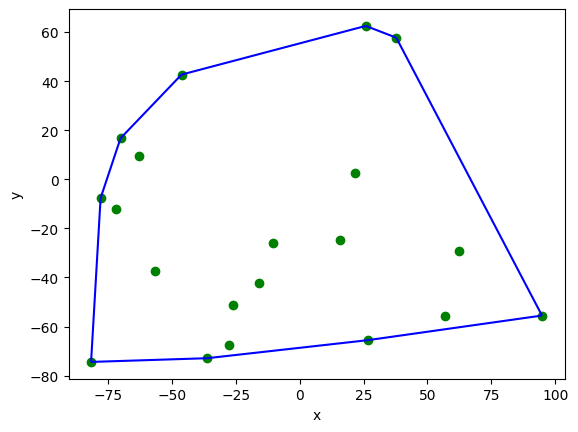

In [3]:
draw_example_1()

### Wprowadzenie

Czym jest otoczka wypukła?  
Podzbiór płaszczyzny $Q$ nazywamy wypukłym wtedy i tylko wtedy, gdy dla dowolnej pary punktów $p, q \in Q$ odcinek $\overline{pq}$ jest całkowicie zawarty w $Q$.  
Otoczka wypukła $\mathcal{CH}(Q)$ zbioru $Q$ jest najmniejszym wypukłym zbiorem zawierającym $Q$.

### Zastosowania otoczki wypukłej

Otoczki wypukłe - w szczególności otoczki wypukłe w przestrzeni trójwymiarowej - są spotykane w różnych zastosowaniach. Na przykład używa się ich do przyspieszania wykrywania kolizji w animacji komputerowej. Przypuśćmy, że chcemy sprawdzić, czy dwa obiekty $\mathcal{P_1}$ i $\mathcal{P_2}$ przecinają się. Jeśli przez większość czasu odpowiedź na to pytanie jest negatywna, to opłaca się następująca strategia. Przybliżamy obiekty przez prostsze obiekty $\widehat{\mathcal{P_1}}$ i $\widehat{\mathcal{P_2}}$, które zawierały oryginały. Jeśli chcemy sprawdzić, czy $\mathcal{P_1}$ i $\mathcal{P_2}$ przecinają się, najpierw sprawdzamy, czy przecinają się $\widehat{\mathcal{P_1}}$ i $\widehat{\mathcal{P_2}}$. Jeśli występuje ten przypadek, to powinniśmy wykonać test na oryginalnych obiektach, który jest przypuszczalnie znacznie kosztowniejszy.  
Sprawdzanie przecięcia otoczek wypukłych jest bardziej skomplikowane niż dla sfer - choć mimo to łatwiejsze niż dla obiektów niewypukłych - ale otoczki wypukłe mogą dużo lepiej przybliżać większość obiektów.

## Generowanie losowych punktów na płaszczyźnie 

In [4]:
def generate_uniform_points(left=-100, right=100, n=100):
    """
    Funkcja generuje równomiernie n punktów na kwadratowym obszarze od left do right (jednakowo na osi y) o współrzędnych rzeczywistych
    :param left: lewy kraniec przedziału
    :param right: prawy kraniec przedziału
    :param n: ilość generowanych punktów
    :return: tablica punktów w postaci krotek współrzędnych, np. [(x1, y1), (x2, y2), ... (xn, yn)]
    """
    tab=[(np.random.uniform(left,right),np.random.uniform(left,right)) for _ in range(n)]
    return tab

<span style="color:red">Ćw.</span> Wygeneruj $100$ losowych punktów w przestrzeni 2D o współrzędnych z przedziału $\langle -100,100\rangle$.

In [5]:
points_a = generate_uniform_points(-100, 100, 100)

Zwizualizuj wygenerowane punkty.

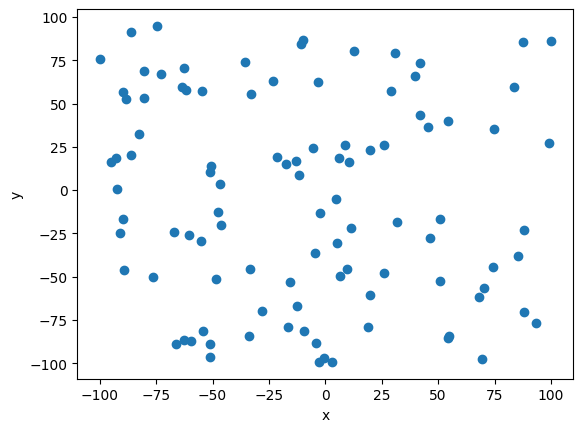

In [6]:
vis = Visualizer()
vis.add_point(points_a)
vis.show()

In [7]:
def generate_circle_points(O, R, n=100):
    """
    Funkcja generuje jednostajnie n punktów na okręgu o środku O i promieniu R
    :param O: krotka współrzędnych x, y określająca środek okręgu
    :param R: promień okręgu
    :param n: ilość generowanych punktów
    :return: tablica punktów w postaci krotek współrzędnych
    """
    tab=[None for _ in range(n)]
    for i in range(n):
        angle=np.random.random()*2*np.pi
        tab[i]=(O[0]+R*np.sin(angle),O[1]+R*np.cos(angle))
    return tab

<span style="color:red">Ćw.</span> Wygeneruj $100$ losowych punktów w przestrzeni 2D leżących na okręgu o środku $O = (0,0)$ i promieniu $R = 10$.

In [8]:
points_b = generate_circle_points((0, 0), 10, 100)

Zwizualizuj wygenerowane punkty.

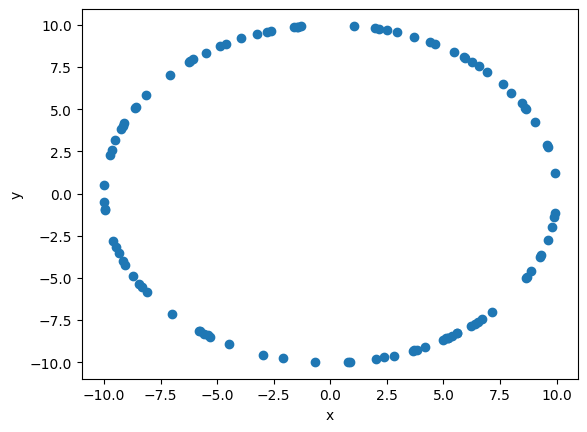

In [9]:
vis.clear()
vis.add_point(points_b)
vis.show()

In [10]:
def generate_rectangle_points(a=(-10, 10), b=(-10, -10), c=(10, -10), d=(10, 10), n=100):
    '''
    Funkcja generuje n punktów na bokach prostokąta o wierzchołkach w punktach a, b, c i d
    :param a: lewy górny wierzchołek prostokąta
    :param b: lewy dolny wierzchołek prostokąta
    :param c: prawy dolny wierzchołek prostokąta
    :param d: prawy górny wierzchołek prostokąta
    :param n: ilość generowanych punktów
    :return: tablica punktów w postaci krotek współrzędnych
    '''
    tab=[None for _ in range(n)]
    left,right=a[0],c[0]
    down,up=c[1],a[1]
    height=up-down
    width=right-left
    max_dist=2*(width+height)
    for i in range(n):
        dist_from_a_ccw=np.random.random()*max_dist
        if 0<=dist_from_a_ccw<height:
            x=left
            y=up-dist_from_a_ccw
        elif height<=dist_from_a_ccw<height+width:
            x=left+(dist_from_a_ccw-height)
            y=down
        elif height+width<=dist_from_a_ccw<2*height+width:
            x=right
            y=down+(dist_from_a_ccw-height-width)
        else:
            x=right-(dist_from_a_ccw-2*height-width)
            y=up
        tab[i]=(x,y)
    return tab

<span style="color:red">Ćw.</span> Wygeneruj $100$ losowych punktów w przestrzeni 2D leżących na bokach prostokąta o wierzchołkach $(-10,10), (-10,-10), (10,-10)$ oraz $(10,10)$.

In [52]:
points_c = generate_rectangle_points((-10, 10), (-10, -10), (10, -10), (10, 10), 100)

Zwizualizuj wygenerowane punkty.

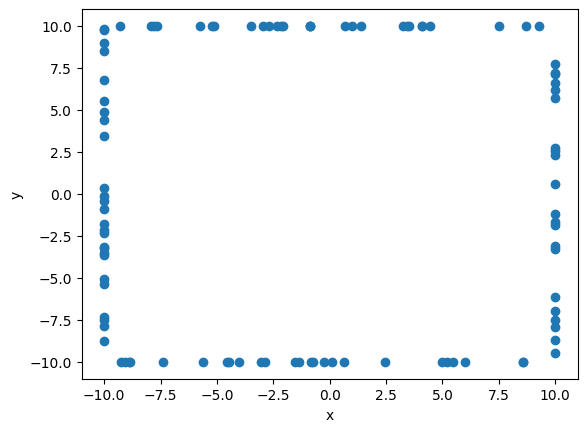

In [53]:
vis.clear()
vis.add_point(points_c)
vis.show()

In [13]:
def generate_square_points(a=(0, 0), b=(10, 0), c=(10, 10), d=(0, 10), axis_n=25, diag_n=20):
    '''
    Funkcja generuje axis_n punktów na dwóch bokach kwadratu leżących na osiach x i y 
    oraz diag_n punktów na przekątnych kwadratu, który wyznaczają punkty a, b, c i d.
    :param a: lewy dolny wierzchołek kwadratu
    :param b: prawy dolny wierzchołek kwadratu
    :param c: prawy górny wierzchołek kwadratu
    :param d: lewy górny wierzchołek kwadratu
    :param axis_n: ilość generowanych punktów na każdym z dwóch boków kwadratu leżących na osi x i y
    :param diag_n: ilość generowanych punktów na każdej przekątnej kwadratu
    :return: tablica punktów w postaci krotek współrzędnych
    '''
    tab=[]
    left,right=a[0],c[0]
    down,up=a[1],c[1]
    for p in [a,b,c,d]:
        tab.append(p)
    for i in range(axis_n):
        y=np.random.uniform(down,up)
        tab.append((left,y))
    for i in range(axis_n):
        x=np.random.uniform(left,right)
        tab.append((x,down))
    for i in range(diag_n):
        cord=np.random.uniform(left,right)
        tab.append((cord,cord))
    for i in range(diag_n):
        cord=np.random.uniform(left,right)
        tab.append((cord,(up-down)-cord))
    return tab    

<span style="color:red">Ćw.</span> Wygeneruj zbiór losowych punktów w przestrzeni 2D w następujący sposób: po 25 punktów na dwóch bokach kwadratu leżących na osiach i po 20 punktów na przekątnych kwadratu, zawierający także punkty wyznaczające kwadrat $(0, 0), (10, 0), (10, 10)$ oraz $(0, 10)$.

In [14]:
points_d = generate_square_points((0, 0), (10, 0), (10, 10), (0, 10), 25, 20)

Zwizualizuj wygenerowane punkty.

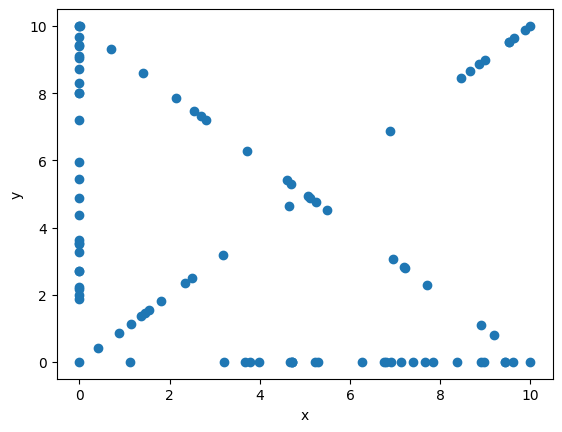

In [15]:
vis.clear()
vis.add_point(points_d)
vis.show()

## Algorytm Grahama oraz algorytm Jarvisa

Po przygotowaniu przykładowych zbiorów danych i ich zwizualizowaniu, chcemy zobaczyć jak buduje się dla nich otoczka wypukła z wykorzystaniem różnych algorytmów.  
W tych dwóch algorytmach potrzebna będzie funkcja którą już dobrze znamy, czyli ta sprawdzająca, po której stronie prostej znajduje się punkt.  
Dla każdego algorytmu trzeba będzie zaimplementować dwie funkcje obliczające otoczkę wypukłą, ze względu na to, że jedna z nich będzie miała możliwość wyświetlania kroków postępowania w algorytmie. Druga funkcja będzie użyteczna do porównywania czasów dla różnych zbiorów danych i względem algorytmów.  
W wersji "graficznej" funkcji danego algorytmu, jednym kolorem będą zaznaczone wszystkie punkty zbioru wyjściowego, drugim kolorem boki aktualne rozpatrywane, a trzecim boki wielokąta otoczki. Po zakończeniu wyznaczania otoczki, wierzchołki otoczki zostaną wyróżnione (osobnym kolorem bądź kształtem).  

### Algorytm Grahama

Algorytm Grahama tworzy otoczkę wypukłą poprzez utrzymywanie stosu $S$, w którym znajdują się punkty, które mogą, ale nie muszą tworzyć otoczki wypukłej. Za każdym razem jest wstawiany na stos (push) jeden punkt ze zbioru punktów $Q$ i jest on usuwany ze stosu (pop), jeżeli nie jest punktem $\mathcal{CH}(Q)$. Kiedy algorytm kończy się, stos $S$ zawiera tylko punkty otoczki wypukłej $\mathcal{CH}(Q)$ w kierunku przeciwnym do ruchu wskazówek zegara.

---

Procedura $\mathtt{Graham-Build(Q)}$ przyjmuje zbiór punktów $Q$, gdzie $|Q| \geq 3$. Wywołuje ona funkcję $\mathtt{TOP(S)}$, która zwraca punkt z góry stosu bez zmieniania $S$ oraz
$\mathtt{NEXT-TO-TOP(S)}$, która zwraca punkt poniżej góry stosu $S$, bez zmieniania stosu. Funkcja $\mathtt{PUSH(p, S)}$ wstawia punkt $p$ na stos $S$. Funkcja $\mathtt{POP(S)}$ usuwa punkt z wierzchołka stosu $S$.

$\mathtt{Graham-Build(Q)}$  
1)  niech $p_0$ będzie punktem w zbiorze Q z najmniejszą współrzędną $y$  
    oraz najmniejszą współrzędną $x$ w przypadku, gdy wiele punktów ma tę samą współrzędną $y$  
    
2)  niech $\mathtt{\langle p_1, p_2, \dots, p_m \rangle}$ będzie pozostałym zbiorem punktów w $Q$, posortowanym  
    przeciwnie do ruchu wskazówek zegara wokół punktu $p_0$  
    (jeżeli więcej niż jeden punkt ma ten sam kąt, to usuwamy wszystkie punkty  
     z wyjątkiem tego najbardziej oddalonego od $p_0$)  
3) stwórz pusty stos $S$  
4) $\mathtt{PUSH(p_0, S)}$
5) $\mathtt{PUSH(p_1, S)}$
6) $\mathtt{PUSH(p_2, S)}$
7) **for** $i = 3$ **to** m  
8) &emsp;**while** kąt utworzony przez $\mathtt{NEXT-TO-TOP(S)}$, $\mathtt{TOP(S)}$ oraz $p_i$ tworzy lewostronny skręt
9) &emsp;&emsp;$\mathtt{POP(S)}$
10) &emsp;$\mathtt{PUSH(p_i, S)}$
11) **return** $S$


---

Lewostronny skręt oznacza, że dla trzech kolejnych punktów $a, b, c$, punkt $b$ leży po lewej stronie prostej $ac$.
Do sprawdzania "lewoskrętności" używam wyznacznika macierzy 3x3, na podstawie poprzedniego laboratorium.

In [16]:
def mat_det_3x3(a, b, c):
    """
    Funkcja oblicza wyznacznik macierzy 3x3 (bez użycia funkcji bibliotecznych)
    :param a: krotka współrzędnych (x, y) punktu poniżej góry stosu
    :param b: krotka współrzędnych (x, y) punktu na górze stosu
    :param c: krotka współrzędnych (x, y) punktu, dla którego badamy lewostronny skręt
    :return: wartość odpowiedniego wyznacznika macierzy
    Uwaga! W porównaniu do wyznacznika z labortorium pierwszego, punkty b i c są zamienione miejscami
    """
    return a[0]*c[1]+a[1]*b[0]+c[0]*b[1]-c[1]*b[0]-a[0]*b[1]-a[1]*c[0]

Poniżej funkcje pomocnicze do algorytmu Grahama.

In [17]:
def find_min_y(Q):
    """
    Funkcja znajduje punkt o najmniejszej współrzędnej y,
    w przypadku, gdy wiele punktów ma tę samą współrzędną y, to wśród nich ten z najmniejszą współrzędną x
    :param Q: zbiór punktów
    :return: krotka (x,y) współrzędnych szukanego punktu
    """
    n=len(Q)
    min_point=Q[0]
    for i in range(1,n):
        if Q[i][1]<min_point[1] or (Q[i][1]==min_point[1] and Q[i][0]<min_point[0]):
            min_point=Q[i]
    return min_point

In [18]:
def find_angles_and_dists_to_q(q,Q):
    """
    Funkcja oblicza dla każdego punktu z Q kąt między prostą wyznaczoną przez ten punkt i punkt q a dodatnią półosią osi OX
    oraz odległość tego punktu do punktu q
    :param q: punkt o najmniejszej współrzędnej y (najmniejszej współrzędnej x dla wielu punktów o tej samej współrzędnej y)
    :param Q: zbiór punktów
    :return: tablica krotek postaci (wartość kąta w radianach, odległość od q, współrzędna x, współrzędna y)
    """
    A=[(0,0,q[0],q[1])]
    n=len(Q)
    for i in range(n):
        if Q[i]==q: continue
        delta_x=Q[i][0]-q[0]
        delta_y=Q[i][1]-q[1]
        dist=(delta_x**2+delta_y**2)**0.5
        angle=(int(np.arccos(delta_x/dist)*10**12))/10**12
        A.append((angle,dist,Q[i][0],Q[i][1]))
    return A

In [19]:
def delete_duplicates(A):
    """
    Funkcja usuwa punkty, które wyznaczają ten sam kąt, z wyjątkiem najbardziej oddalonego punktu od punktu 
    o najmniejszej współrzędnej y lub najmniejszej współrzędnej x dla wielu punktów o tej samej współrzędnej y
    :param A: tablica punktów posortowanych względem kąta przez nich wyznaczanego, dla tych samych kątów względem odległości
    :return: tablica krotek (x,y) współrzędnych punktów o unikalnych wartościach wyznaczanych kątów
    """
    T=[(A[0][2],A[0][3])]
    n=len(A)
    for i in range(2,n):
        if A[i][0]>A[i-1][0]:
            T.append((A[i-1][2],A[i-1][3]))
    if n>1: T.append((A[n-1][2],A[n-1][3]))
    return T

<span style="color:red">Ćw.</span> Uzupełnij funkcję ```graham_algorithm```, która oblicza otoczkę wypukłą korzystając z algorytmu Grahama.

In [20]:
def graham_algorithm(Q):
    '''
    Funkcja buduje otoczkę wypukłą dla podanego zbioru punktów Q algorymem Grahama
    :param Q: zbiór punktów
    :return: tablica punktów tworzących otoczkę wypukłą w postaci krotek współrzędnych
    '''
    q=find_min_y(Q)
    A=find_angles_and_dists_to_q(q,Q)
    A.sort()
    T=delete_duplicates(A)
    n=len(T)
    S=[]
    for i in range(min(n,3)):
        S.append(T[i])
    for i in range(3,n):
        while len(S)>2 and mat_det_3x3(S[-2],S[-1],T[i])>-10**(-24):
            S.pop()
        S.append(T[i])
    return S 

Przetestuj swoją implementacje algorytmu Grahama, by sprawdzić czy poprawnie obliczana jest otoczka.

In [21]:
Test().runtest(1, graham_algorithm)

Lab 2, task 1:
	Test 1: Passed
	Test 2: Passed
	Test 3: Passed
	Test 4: Passed
	Test 5: Passed
	Test 6: Passed
	Test 7: Passed
	Test 8: Passed
	Test 9: Passed
	Test 10: Passed
	Test 11: Passed
Result: 11/11
Time: 1.531s


<span style="color:red">Ćw.</span> Uzupełnij funkcję ```graham_algorithm_draw```, która oblicza otoczkę wypukłą korzystając z algorytmu Grahama z dodatkową opcją wyświetlania kroków algorytmu.

In [22]:
def graham_algorithm_draw(Q):
    '''
    Funkcja buduje otoczkę wypukłą dla podanego zbioru punktów Q algorytmem Grahama oraz pokazuje poszczególne kroki algorytmu
    :param Q: zbiór punktów
    :return: krotka w postaci (tablica punktów w postaci krotek współrzędnych, wizualizer pokazujący kroki algorytmu) 
    '''
    q=find_min_y(Q)
    A=find_angles_and_dists_to_q(q,Q)
    A.sort()
    T=delete_duplicates(A)
    n=len(T)
    S=[]
    edges=[]
    vis=Visualizer()
    vis.add_point(Q)
    for i in range(min(n,3)):
        S.append(T[i])
        vis.add_point(S[-1],color="red")
    for i in range(min(n-1,2)):
        ls=vis.add_line_segment([S[i],S[i+1]],color="red")
        edges.append(ls)
    for i in range(3,n):
        while len(S)>2 and mat_det_3x3(S[-2],S[-1],T[i])>-10**(-24):
            vis.remove_figure(edges[-1])
            vis.add_point(S[-1],color="brown")
            S.pop()
            edges.pop()
        S.append(T[i])
        vis.add_point(S[-1],color="red")
        ls=vis.add_line_segment([S[-2],S[-1]],color="red")
        edges.append(ls) 
    vis.add_line_segment([S[-1],S[0]],color="red")
    return S,vis

Zwizualizuj swoją implementację algorytmu.

Zbiór danych A

In [23]:
graham_points_a, vis_graham_a = graham_algorithm_draw(points_a)
print(len(graham_points_a))

13


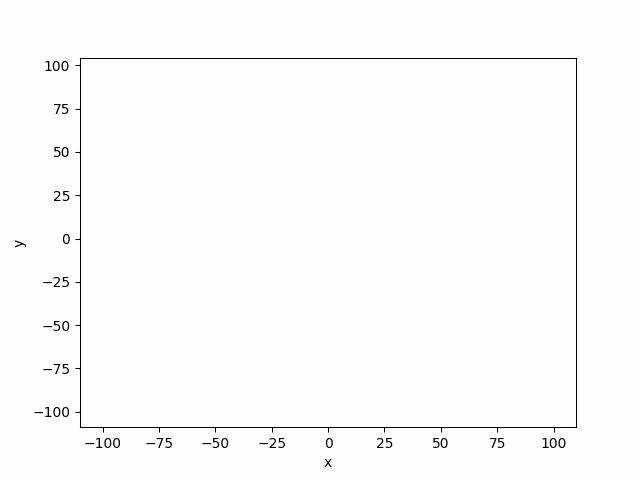

In [24]:
vis_graham_a.show_gif(interval=200)

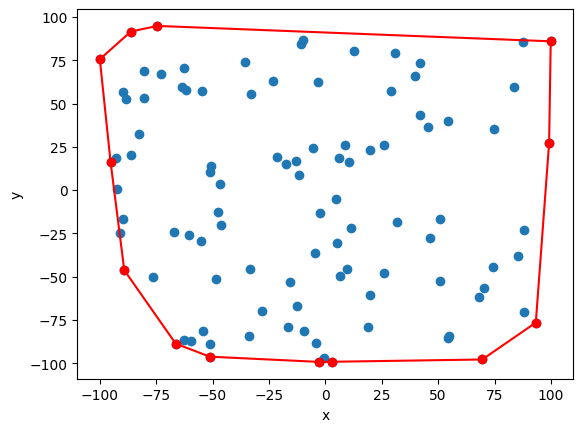

In [25]:
# visualize(graham_points_a)
vis.clear()
vis.add_point(points_a)
vis.add_point(graham_points_a,color="red")
vis.add_line_segment([(graham_points_a[i], graham_points_a[i+1]) for i in range(len(graham_points_a)-1)],color="red")
vis.add_line_segment([graham_points_a[-1], graham_points_a[0]],color="red")
vis.show()

Zbiór danych B

In [26]:
graham_points_b, vis_graham_b = graham_algorithm_draw(points_b)
print(len(graham_points_b))

100


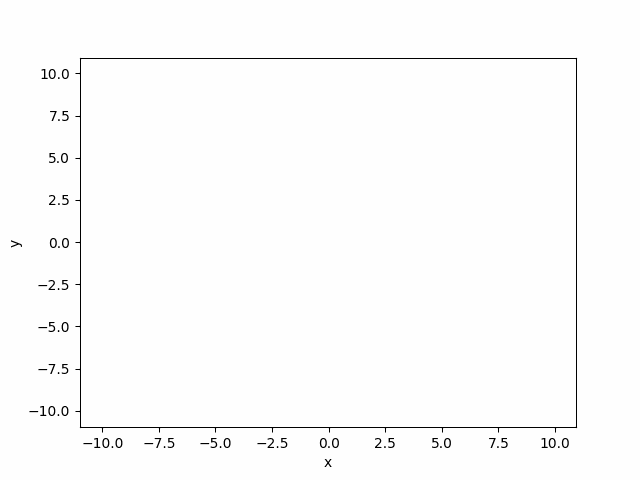

In [27]:
vis_graham_b.show_gif()

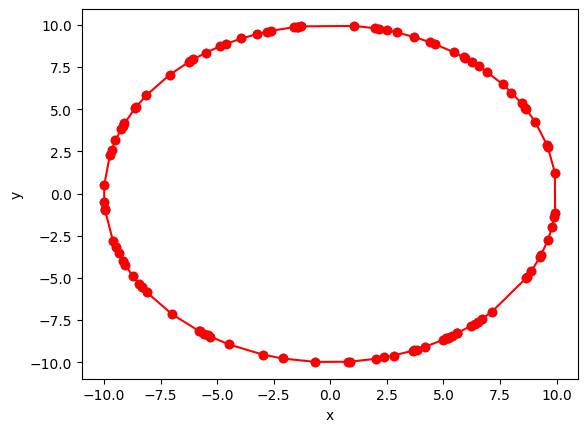

In [28]:
# visualize(graham_points_b)
vis.clear()
vis.add_point(points_b)
vis.add_point(graham_points_b,color="red")
vis.add_line_segment([(graham_points_b[i], graham_points_b[i+1]) for i in range(len(graham_points_b)-1)],color="red")
vis.add_line_segment([graham_points_b[-1], graham_points_b[0]],color="red")
vis.show()

Zbiór danych C

In [54]:
graham_points_c, vis_graham_c = graham_algorithm_draw(points_c)
print(len(graham_points_c))

8


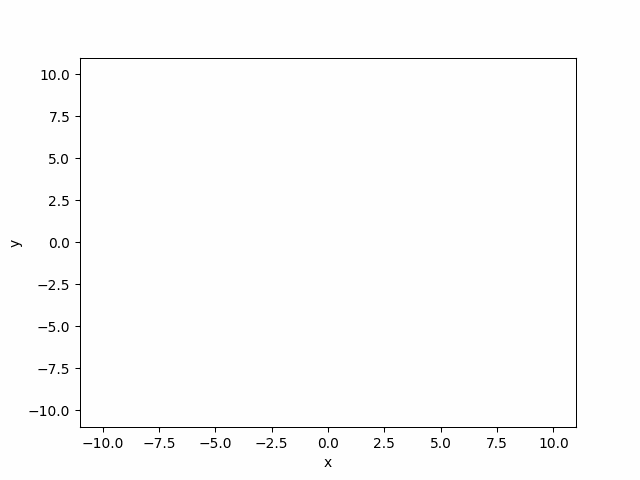

In [55]:
vis_graham_c.show_gif()

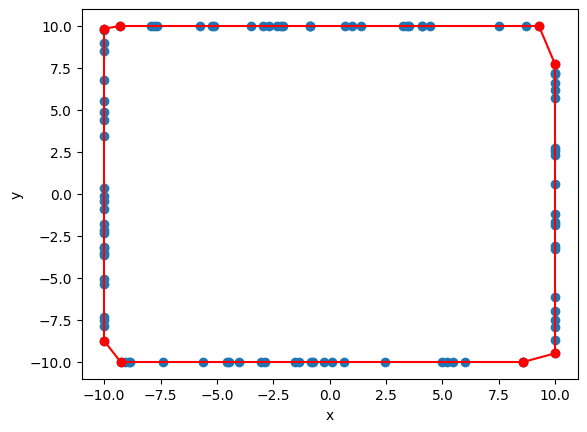

In [56]:
# visualize(graham_points_c)
vis.clear()
vis.add_point(points_c)
vis.add_point(graham_points_c,color="red")
vis.add_line_segment([(graham_points_c[i], graham_points_c[i+1]) for i in range(len(graham_points_c)-1)],color="red")
vis.add_line_segment([graham_points_c[-1], graham_points_c[0]],color="red")
vis.show()

Zbiór danych D

In [32]:
graham_points_d, vis_graham_d = graham_algorithm_draw(points_d)
print(len(graham_points_d))

4


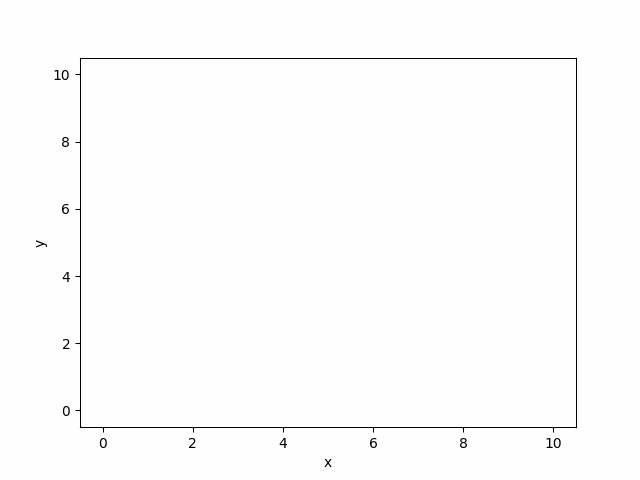

In [33]:
vis_graham_d.show_gif()

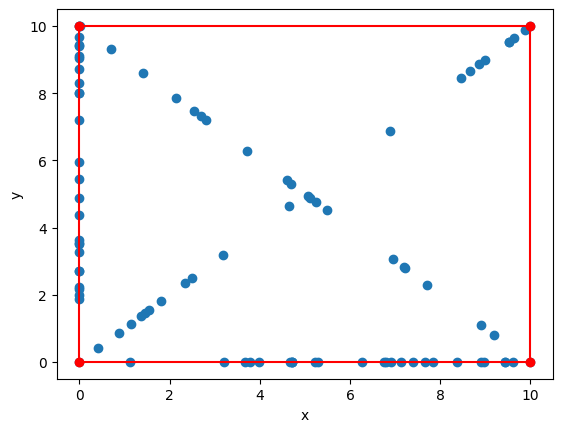

In [34]:
# visualize(graham_points_d)
vis.clear()
vis.add_point(points_d)
vis.add_point(graham_points_d,color="red")
vis.add_line_segment([(graham_points_d[i], graham_points_d[i+1]) for i in range(len(graham_points_d)-1)],color="red")
vis.add_line_segment([graham_points_d[-1], graham_points_d[0]],color="red")
vis.show()

### Algorytm Jarvisa

Algorytm Jarvisa oblicza otoczkę wypukłą dla zbioru punktów $Q$ przez technikę zwaną owijaniem paczki (*package wrapping*) lub owijaniem prezentu (*gift wrapping*). Algorytm Jarvisa buduje sekwencję $H = \langle p_0, p_1, \dots, p_m \rangle$ będącą wierzchołkami $\mathcal{CH}(Q)$. Zaczynamy od punktu $p_0$, następny punkt $p_1$ w otoczce wypukłej ma najmniejszy kąt w odniesieniu do $p_0$ (w przypadku takiego samego kąta - wybiera się punkt najdalej od $p_0$). Podobnie, $p_2$ ma najmniejszy kąt w odniesieniu do $p_1$ itd. Warto zauważyć, że możemy tym sposobem obliczyć lewy i prawy łańcuch otoczki wypukłej $\mathcal{CH}(Q)$. Lewy łańcuch buduje się podobnie - gdy osiągniemy najwyższy wierzchołek w prawym łańcuchu $p_k$, wybieramy wierzchołek $p_{k+1}$, który ma najmniejszy kąt w odniesieniu do $p_k$, ale od ujemnej półosi $OX$. Można zaimplementować algorytm Jarvisa bez konstruowania pomocniczych łańcuchów - lewego i prawego. Taka implementacja utrzymuje śledzenie kąta ostatniej strony otoczki wypukłej i wymaga sekwencji kątów boków otoczki tylko rosnącej (patrząc na trzy ostatnie punkty jesteśmy w stanie obliczyć, jaki punkt należy włączyć do $\mathcal{CH}(Q)$ w zależności od badanego punktu).

<span style="color:red">Ćw.</span> Uzupełnij funkcję ```jarvis_algorithm```, która oblicza otoczkę wypukłą korzystając z algorytmu Jarvisa.

In [35]:
def jarvis_algorithm(Q):
    '''
    Funkcja buduje otoczkę wypukłą dla podanego zbioru punktów Q algorymem Jarvisa
    :param Q: zbiór punktów
    :return: tablica punktów w postaci krotek współrzędnych
    '''
    n=len(Q)
    if n<=2: return Q
    S=[find_min_y(Q)]
    last_vect=(1,0)
    last_len=1.0
    curr_point=None
    while curr_point!=S[0]:
        min_angle=float('inf')
        max_dist=-float('inf')
        for i in range(n):
            if Q[i]!=S[-1]:
                delta_x=Q[i][0]-S[-1][0]
                delta_y=Q[i][1]-S[-1][1]
                dist=(delta_x**2+delta_y**2)**0.5
                angle=(int(np.arccos((int(((delta_x*last_vect[0]+delta_y*last_vect[1])/(dist*last_len))*10**12))/10**12)*10**12))/10**12
                if angle<min_angle or (angle==min_angle and dist>max_dist): 
                    curr_point=Q[i]
                    min_angle=angle
                    max_dist=dist
        if curr_point!=S[0]:
            S.append(curr_point)
            last_vect=(S[-1][0]-S[-2][0],S[-1][1]-S[-2][1])
            last_len=(last_vect[0]**2+last_vect[1]**2)**0.5
    return S 

Przetestuj swoją implementacje algorytmu Jarvisa, by sprawdzić czy poprawnie obliczana jest otoczka.

In [36]:
Test().runtest(2, jarvis_algorithm)

Lab 2, task 2:
	Test 1: Passed
	Test 2: Passed
	Test 3: Passed
	Test 4: Passed
	Test 5: Passed
	Test 6: Passed
	Test 7: Passed
	Test 8: Passed
	Test 9: Passed
	Test 10: Passed
	Test 11: Passed
Result: 11/11
Time: 17.406s


<span style="color:red">Ćw.</span> Uzupełnij funkcję ```jarvis_algorithm_draw```, która oblicza otoczkę wypukłą korzystając z algorytmu Jarvisa z dodatkową opcją wyświetlania kroków algorytmu.

In [37]:
def jarvis_algorithm_draw(Q):
    '''
    Funkcja buduje otoczkę wypukłą dla podanego zbioru punktów Q algorymem Jarvisa oraz pokazuje poszczególne kroki algorytmu
    :param Q: zbiór punktów
    :return: krotka w postaci (tablica punktów w postaci krotek współrzędnych, wizualizer pokazujący kroki algorytmu) 
    '''
    n=len(Q)
    S=[find_min_y(Q)]
    last_vect=(1,0)
    last_len=1.0
    curr_point=None
    vis=Visualizer()
    vis.add_point(Q)
    vis.add_point(S[0],color="red")
    while curr_point!=S[0]:
        min_angle=float('inf')
        max_dist=-float('inf')
        for i in range(n):
            if Q[i]!=S[-1]:
                delta_x=Q[i][0]-S[-1][0]
                delta_y=Q[i][1]-S[-1][1]
                dist=(delta_x**2+delta_y**2)**0.5
                angle=(int(np.arccos((int(((delta_x*last_vect[0]+delta_y*last_vect[1])/(dist*last_len))*10**12))/10**12)*10**12))/10**12
                if angle<min_angle or (angle==min_angle and dist>max_dist):
                    if curr_point!=None: 
                        vis.remove_figure(ls)
                        vis.remove_figure(p)
                    curr_point=Q[i]
                    p=vis.add_point(curr_point,color="yellow")
                    ls=vis.add_line_segment([S[-1],Q[i]],color="yellow")
                    min_angle=angle
                    max_dist=dist
        if curr_point!=S[0]:
            vis.add_point(curr_point,color="red")
            vis.add_line_segment((S[-1],curr_point),color="red")
            S.append(curr_point)
            last_vect=(S[-1][0]-S[-2][0],S[-1][1]-S[-2][1])
            last_len=(last_vect[0]**2+last_vect[1]**2)**0.5
        else: vis.add_point(S[0],color="red")
    vis.add_line_segment((S[-1],S[0]),color="red")
    return S, vis

Zwizualizuj swoją implementację algorytmu.

Zbiór danych A

In [38]:
jarvis_points_a, vis_jarvis_a = jarvis_algorithm_draw(points_a)
print(len(jarvis_points_a))

13


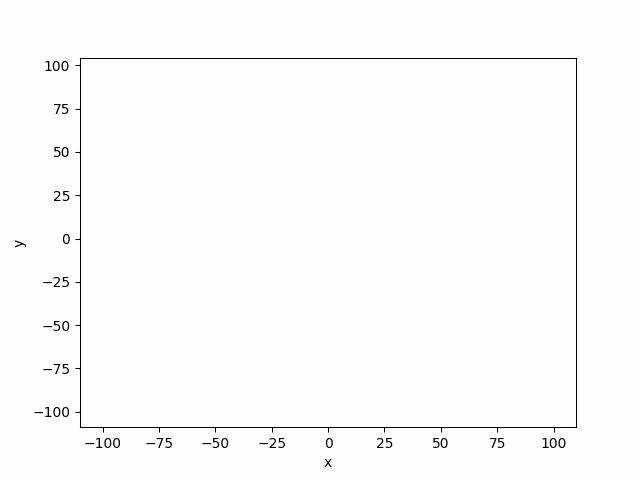

In [39]:
vis_jarvis_a.show_gif()

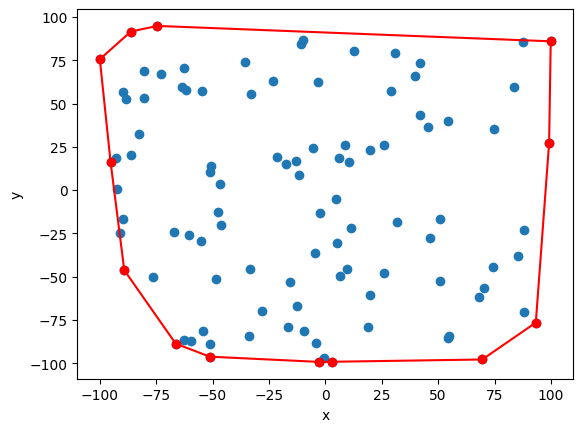

In [40]:
#visualize(jarvis_points_a)
vis.clear()
vis.add_point(points_a)
vis.add_point(jarvis_points_a,color="red")
vis.add_line_segment([(jarvis_points_a[i], jarvis_points_a[i+1]) for i in range(len(jarvis_points_a)-1)],color="red")
vis.add_line_segment([jarvis_points_a[-1], jarvis_points_a[0]],color="red")
vis.show()

Zbiór danych B

In [41]:
jarvis_points_b, vis_jarvis_b = jarvis_algorithm_draw(points_b)
print(len(jarvis_points_b))

100


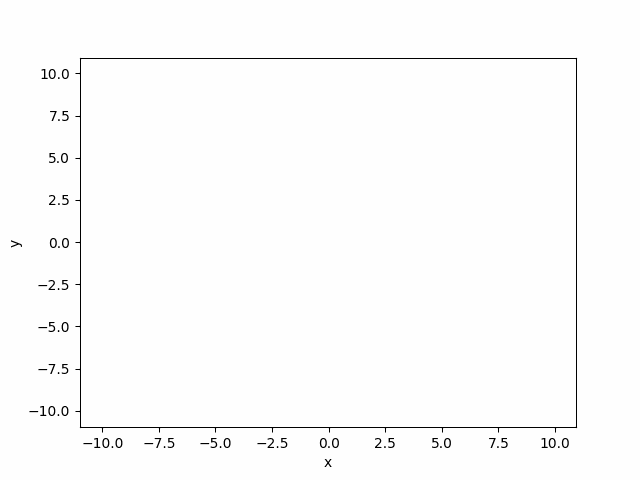

In [42]:
vis_jarvis_b.show_gif()

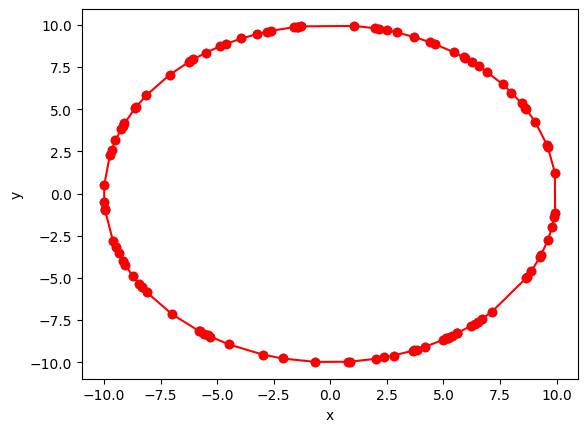

In [43]:
# visualize(jarvis_points_b)
vis.clear()
vis.add_point(points_b)
vis.add_point(jarvis_points_b,color="red")
vis.add_line_segment([(jarvis_points_b[i], jarvis_points_b[i+1]) for i in range(len(jarvis_points_b)-1)],color="red")
vis.add_line_segment([jarvis_points_b[-1], jarvis_points_b[0]],color="red")
vis.show()

Zbiór danych C

In [57]:
jarvis_points_c, vis_jarvis_c = jarvis_algorithm_draw(points_c)
print(len(jarvis_points_c))

8


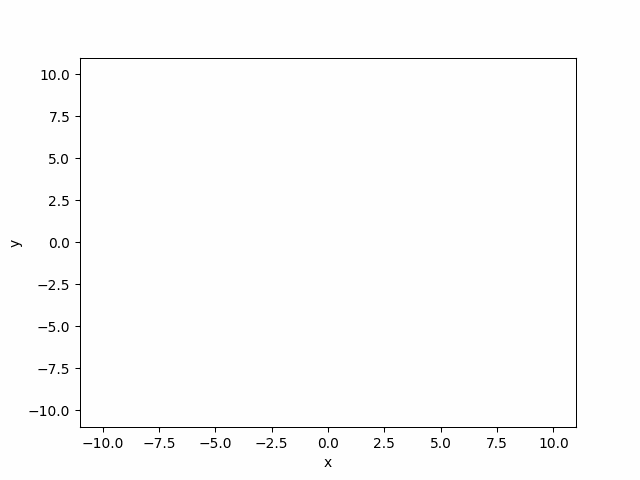

In [58]:
vis_jarvis_c.show_gif()

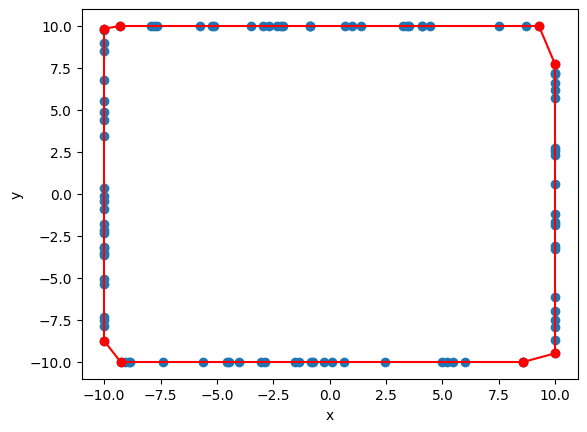

In [59]:
# visualize(jarvis_points_c)
vis.clear()
vis.add_point(points_c)
vis.add_point(jarvis_points_c,color="red")
vis.add_line_segment([(jarvis_points_c[i], jarvis_points_c[i+1]) for i in range(len(jarvis_points_c)-1)],color="red")
vis.add_line_segment([jarvis_points_c[-1], jarvis_points_c[0]],color="red")
vis.show()

Zbiór danych D

In [47]:
jarvis_points_d, vis_jarvis_d = jarvis_algorithm_draw(points_d)
print(len(jarvis_points_d))

4


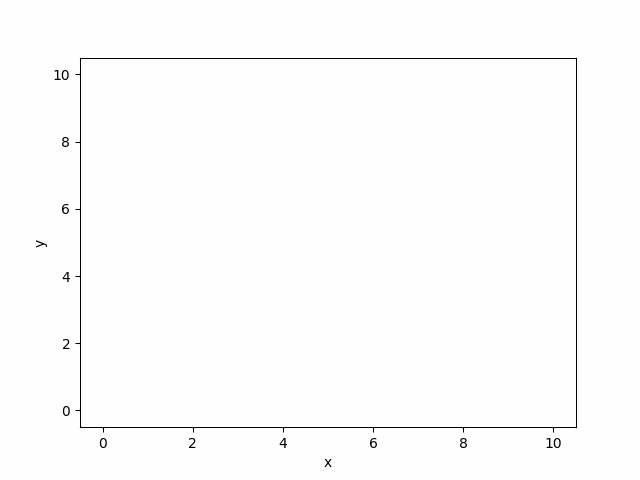

In [48]:
vis_jarvis_d.show_gif()

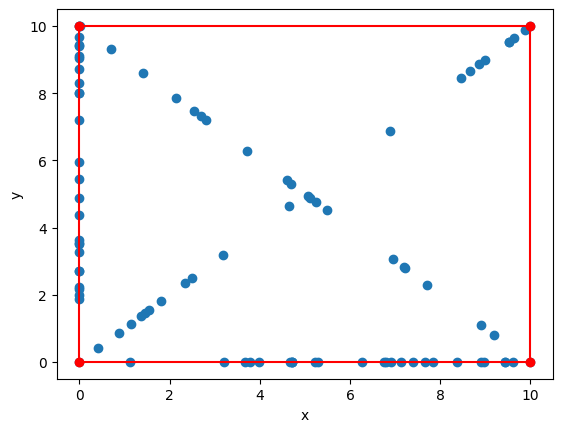

In [49]:
# visualize(jarvis_points_d)
vis.clear()
vis.add_point(points_d)
vis.add_point(jarvis_points_d,color="red")
vis.add_line_segment([(jarvis_points_d[i], jarvis_points_d[i+1]) for i in range(len(jarvis_points_d)-1)],color="red")
vis.add_line_segment([jarvis_points_d[-1], jarvis_points_d[0]],color="red")
vis.show()


---

Po zobaczeniu i przetestowaniu wstępnych zbiorów danych, przyszła kolej na porównanie czasów działania dla różnych danych. Do tego potrzebujemy bardziej miarodajnych zbiorów.  
<span style="color:red">Ćw.</span> Stwórz zmodyfikowane zbiory danych A, B, C oraz D.

In [50]:
no_points_acd=[100,1000,5000,10000,50000]
no_points_b=[10,100,500,1000,5000]
new_points_a=[generate_uniform_points(-1000, 1000, no_points_acd[i]) for i in range(len(no_points_acd))]
new_points_b=[generate_circle_points((100,100), 500, no_points_b[i]) for i in range(len(no_points_b))]
new_points_c=[generate_rectangle_points((-200,50), (-200,-150), (100,-150), (100,50), no_points_acd[i]) for i in range(len(no_points_acd))]
new_points_d=[generate_square_points((0,0), (100,0), (100,100), (0,100), int(0.3*no_points_acd[i])-1, int(0.2*no_points_acd[i])-1) for i in range(len(no_points_acd))]

Po przygotowaniu zbiorów danych, dokonaj porównania czasowego.  
<span style="color:red">Ćw.</span> Porównaj zmodyfikowane zbiory danych A, B, C oraz D dla algorytmów Grahama i Jarvisa.

In [51]:
from time import time
new_points=[("Zbiór A",new_points_a), ("Zbiór B",new_points_b), ("Zbiór C",new_points_c), ("Zbiór D",new_points_d)]
for i in range (len(new_points)):
    print(new_points[i][0],":")
    for j in range(len(new_points[i][1])):
        print("Liczba punktów:",len(new_points[i][1][j]),"\nAlgorytm Grahama: ",end='')
        t0=time()
        graham_algorithm(new_points[i][1][j])
        t1=time()
        print("czas wykonania {ex_time:.4f} s".format(ex_time=t1-t0))
        print("Algorytm Jarvisa: ",end='')
        t0=time()
        jarvis_algorithm(new_points[i][1][j])
        t1=time()
        print("czas wykonania {ex_time:.4f} s\n".format(ex_time=t1-t0))

Zbiór A :
Liczba punktów: 100 
Algorytm Grahama: czas wykonania 0.0010 s
Algorytm Jarvisa: czas wykonania 0.0050 s

Liczba punktów: 1000 
Algorytm Grahama: czas wykonania 0.0060 s
Algorytm Jarvisa: czas wykonania 0.0738 s

Liczba punktów: 5000 
Algorytm Grahama: czas wykonania 0.0319 s
Algorytm Jarvisa: czas wykonania 0.4378 s

Liczba punktów: 10000 
Algorytm Grahama: czas wykonania 0.0618 s
Algorytm Jarvisa: czas wykonania 1.1867 s

Liczba punktów: 50000 
Algorytm Grahama: czas wykonania 0.3441 s
Algorytm Jarvisa: czas wykonania 4.5718 s

Zbiór B :
Liczba punktów: 10 
Algorytm Grahama: czas wykonania 0.0010 s
Algorytm Jarvisa: czas wykonania 0.0000 s

Liczba punktów: 100 
Algorytm Grahama: czas wykonania 0.0010 s
Algorytm Jarvisa: czas wykonania 0.0519 s

Liczba punktów: 500 
Algorytm Grahama: czas wykonania 0.0030 s
Algorytm Jarvisa: czas wykonania 1.3325 s

Liczba punktów: 1000 
Algorytm Grahama: czas wykonania 0.0079 s
Algorytm Jarvisa: czas wykonania 6.1270 s

Liczba punktów: 5000

---

Bibliografia:
- Wprowadzenie do algorytmów wydanie 3, Thomas H. Cormen, Charles E. Leiserson, Ronald L. Rivest, Stein Clifford
